## Task 2: 
## Predicting the star ratings from the Yelp reviews for Restaurants in Las Vegas

In [1]:

from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:

import pandas as pd
import re
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.utils import resample
import seaborn as sns
import matplotlib.pyplot as plt
import string


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [0]:

yelp_reviews  = pd.read_csv("/content/drive/My Drive/yelp_review.csv")

yelp_business = pd.read_csv("/content/drive/My Drive/yelp_business.csv")

yelp_user = pd.read_csv("/content/drive/My Drive/yelp_user.csv")

yelp_tips = pd.read_csv("/content/drive/My Drive/yelp_tip.csv")

yelp_checkin = pd.read_csv("/content/drive/My Drive/yelp_checkin.csv")

yelp_business_attributes = pd.read_csv("/content/drive/My Drive/yelp_business_attributes.csv")


In [0]:
#Yelp largest business based cities
yelp_business['city'].value_counts().nlargest(10).plot(kind='bar')
plt.xlabel("Cities")
plt.ylabel("No.of Businesses")
plt.title("City wise Business Distribution")


In [0]:
'''
Selecting the city Las Vegas and its restaurants
'''
yelp_business_lasvegas = yelp_business.loc[yelp_business['city'].isin(['Las Vegas'])]
yelp_business_lasvegas_res = yelp_business_lasvegas[yelp_business_lasvegas['categories'].str.contains('Restaurant') == True]
yelp_business_lasvegas_res.shape

(5902, 13)

In [0]:

print("No of restaurants in Las Vegas ",yelp_business_lasvegas_res.shape[0])


No of restaurants in Las Vegas  5902


In [0]:
yelp_business_lasvegas_res_bids = yelp_business_lasvegas_res['business_id'].tolist()
yelp_reviews_lasvegas_res = yelp_reviews[yelp_reviews['business_id'].isin(yelp_business_lasvegas_res_bids)]
yelp_reviews_lasvegas_res.shape

(929636, 9)

In [0]:
yelp_reviews_lasvegas_res.head(5)

,review_id,user_id,business_id,stars,date,text,useful,funny,cool
122,QgSf2JvYz-M4PU2yuJjxNQ,nOTl4aPC4tKHK35T3bNauQ,9Jc3W0aR9Xf2gcHI0rEXsw,1,2012-08-23,"After being scared away from Rock & Rita's, we...",0,1,0
123,gN6GARS_BRr5UX2D3WAH0w,nOTl4aPC4tKHK35T3bNauQ,xVEtGucSRLk5pxxN0t4i6g,5,2012-08-23,We got recommendations for this place from my ...,0,0,0
148,t4oXDPN4S4USIhBGpuSD8A,nOTl4aPC4tKHK35T3bNauQ,2LZGeJy8qByYKB71ML-jcw,2,2012-08-23,We got a coupon to eat here when we checked in...,2,1,0
181,R9w7GeMX_KZTV23gmI8Zjg,tL2pS5UOmN6aAOi3Z-qFGg,RhV7sraRUB3km-gF-tmDow,3,2013-02-06,I've eaten here numerous times and am still am...,0,0,0
186,oncT7W70CFwzzJkQoz3T5Q,tL2pS5UOmN6aAOi3Z-qFGg,NaZVUOzqk5b-l0mlki-9Og,4,2017-02-10,We stopped in here for lunch this afternoon. S...,2,0,0


In [0]:

print("Total No of reviews ",yelp_reviews_lasvegas_res.shape[0] )


Total No of reviews  929636


In [0]:
#Ratings wise distribution
yelp_reviews_lasvegas_res["stars"].value_counts()


5    375474
4    238853
3    125298
1    104680
2     85331
Name: stars, dtype: int64

In [0]:
#Raw Text
yelp_reviews_lasvegas_res['text']


122        After being scared away from Rock & Rita's, we...
123        We got recommendations for this place from my ...
148        We got a coupon to eat here when we checked in...
181        I've eaten here numerous times and am still am...
186        We stopped in here for lunch this afternoon. S...
                                 ...                        
5261629    I think I may have stayed at a different LVH t...
5261630    This was our first experience at Lawry's and i...
5261633    Walked across the street from HRH for a late l...
5261634    I was here on Sunday 2\/12\/12. OMG let me say...
5261635    I love this place!! I always stop by after wor...
Name: text, Length: 929636, dtype: object

Text(0, 0.5, 'Number of samples')

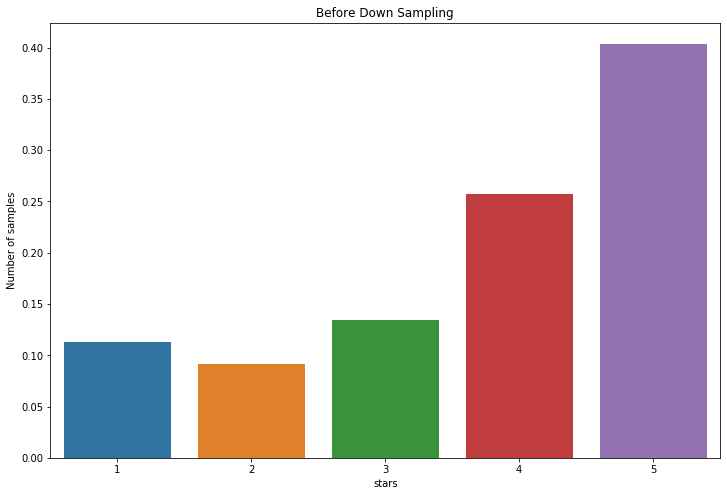

In [0]:
#Checking the Imbalance in the data:
plot_imbal_labels = yelp_reviews_lasvegas_res.groupby(["stars"]).size()
plot_imbal_labels = plot_imbal_labels / plot_imbal_labels.sum()
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(plot_imbal_labels.keys(), plot_imbal_labels.values).set_title("Before Down Sampling")
ax.set_ylabel('Number of samples')

#### Down sampling the imbalanced class and matching the other class data accordingly

In [0]:
stars_5 = yelp_reviews_lasvegas_res[yelp_reviews_lasvegas_res["stars"]==5]
print(stars_5.shape)
stars_5_downsample = resample(stars_5, replace=False, n_samples=50000, random_state=0)
stars_5_downsample.shape

(375474, 9)


(50000, 9)

In [0]:
stars_4 = yelp_reviews_lasvegas_res[yelp_reviews_lasvegas_res["stars"]==4]
print(stars_4.shape)
stars_4_downsample = resample(stars_4, replace=False, n_samples=50000, random_state=0)
stars_4_downsample.shape

(238853, 9)


(50000, 9)

In [0]:
stars_3 = yelp_reviews_lasvegas_res[yelp_reviews_lasvegas_res["stars"]==3]
print(stars_3.shape)
stars_3_downsample = resample(stars_3, replace=False, n_samples=50000, random_state=0)
stars_3_downsample.shape

(125298, 9)


(50000, 9)

In [0]:
stars_1 = yelp_reviews_lasvegas_res[yelp_reviews_lasvegas_res["stars"]==1]
print(stars_1.shape)
stars_1_downsample = resample(stars_1, replace=False, n_samples=50000, random_state=0)
stars_1_downsample.shape

(104680, 9)


(50000, 9)

In [0]:
stars_2 = yelp_reviews_lasvegas_res[yelp_reviews_lasvegas_res["stars"]==2]

print(stars_2.shape)
stars_2_downsample = resample(stars_2, replace=False, n_samples=50000, random_state=0)
stars_2_downsample.shape

(85331, 9)


(50000, 9)

In [0]:
#Concatening the samples and defining the dataframe
yelp_reviews_ds = pd.concat([stars_1_downsample,stars_2_downsample,stars_3_downsample,stars_4_downsample,stars_5_downsample])

In [0]:
yelp_reviews_ds.shape

(250000, 9)

In [0]:
yelp_reviews_ds['stars'].value_counts()

5    50000
4    50000
3    50000
2    50000
1    50000
Name: stars, dtype: int64

Text(0, 0.5, 'Proportion of samples')

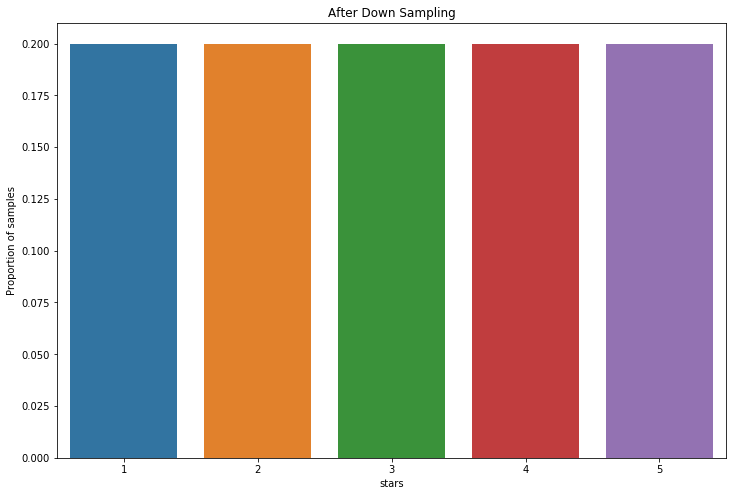

In [0]:
plot_bal_labels = yelp_reviews_ds.groupby(["stars"]).size()
plot_bal_labels = plot_bal_labels / plot_bal_labels.sum()
fig, ax = plt.subplots(figsize=(12,8))
sns.barplot(plot_bal_labels.keys(), plot_bal_labels.values).set_title("After Down Sampling")
ax.set_ylabel('Proportion of samples')

In [0]:
yelp_reviews_ds['text']

1203502    My husband and I wanted to eat soul food while...
2426632    Rose. Rabbit. LIED!! Majorly disappointed. It ...
2435317    very disappointing, they no longer offer a sen...
1257360    RM Seafood is so overrated. I was really disap...
20942      Wow this is seriously the last time I come to ...
                                 ...                        
2272169    good food and good portions. try the watermelo...
1317556    Wow! The almond croissant and the crème brûlée...
1593933    Food was super good, had a very good waitress,...
5239793    I miss Skippers. It seems like no one can make...
406499     We love this place! If you want a quick, tasty...
Name: text, Length: 250000, dtype: object

In [0]:
"""
EDA Before Data Cleaning 

"""



import numpy as np
from nltk.util import ngrams
from collections import Counter


print('Average word length of phrases in corpus is:',np.mean(yelp_reviews_ds['text'].apply(lambda x: len(x.split()))))


def MostCommonPostEDA(star, no):
    text = ' '.join(yelp_reviews_ds.loc[yelp_reviews_ds.stars == star, 'text'].values)
    text_unigrams = [i for i in ngrams(text.split(), 1)]
    text_bigrams = [i for i in ngrams(text.split(), 2)]
    text_trigrams = [i for i in ngrams(text.split(), 3)]
    print("The most common words in star",star,"\n", Counter(text_unigrams).most_common(no))
    print("The most common bigrams in star",star, "\n",Counter(text_bigrams).most_common(no))
    print("The most common trigrams in star",star, "\n",Counter(text_trigrams).most_common(no))
    return Counter(text_unigrams).most_common(no),Counter(text_bigrams).most_common(no),Counter(text_trigrams).most_common(no)



    





Average word length of phrases in corpus is: 122.801768


The most common words in star 1 
 [(('the',), 260216), (('and',), 194210), (('to',), 171715)]
The most common bigrams in star 1 
 [(('of', 'the'), 17076), (('it', 'was'), 15930), (('in', 'the'), 15033)]
The most common trigrams in star 1 
 [(('and', 'it', 'was'), 2459), (('the', 'food', 'was'), 2340), (('I', 'had', 'to'), 2248)]
The most common words in star 2 
 [(('the',), 304975), (('and',), 204720), (('I',), 170105)]
The most common bigrams in star 2 
 [(('of', 'the'), 22899), (('it', 'was'), 21367), (('and', 'the'), 18355)]
The most common trigrams in star 2 
 [(('the', 'food', 'was'), 3312), (('and', 'it', 'was'), 3261), (('The', 'food', 'was'), 2827)]
The most common words in star 3 
 [(('the',), 297382), (('and',), 197004), (('a',), 166756)]
The most common bigrams in star 3 
 [(('of', 'the'), 23526), (('it', 'was'), 21607), (('and', 'the'), 18309)]
The most common trigrams in star 3 
 [(('and', 'it', 'was'), 3637), (('the', 'food', 'was'), 2944), (('a', 'lot', 'of'), 2875)]
The

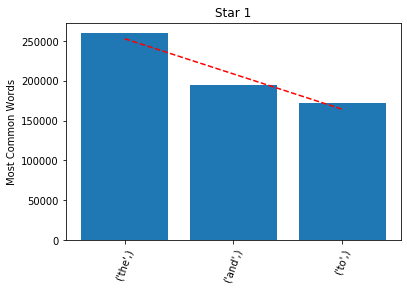

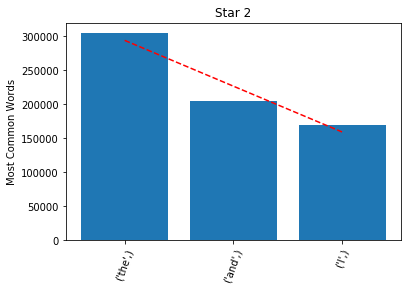

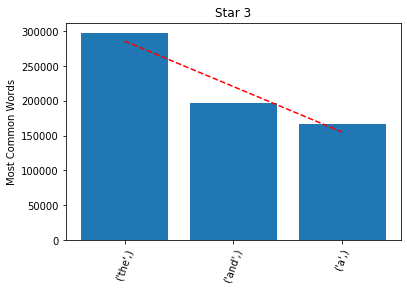

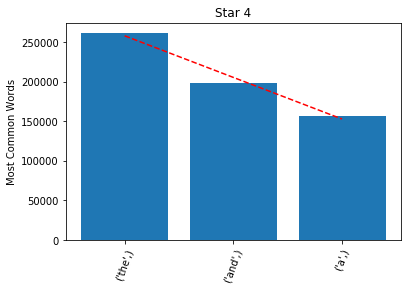

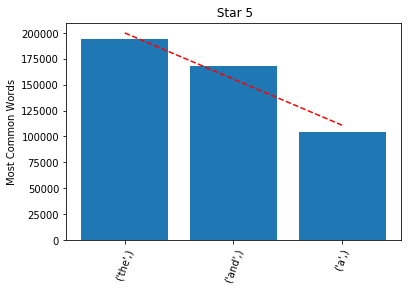

...

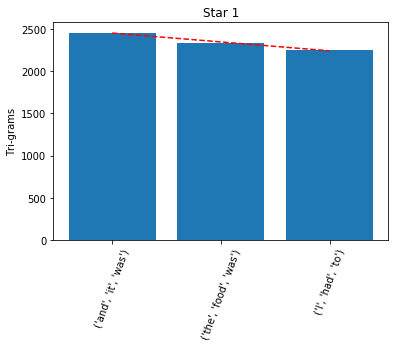

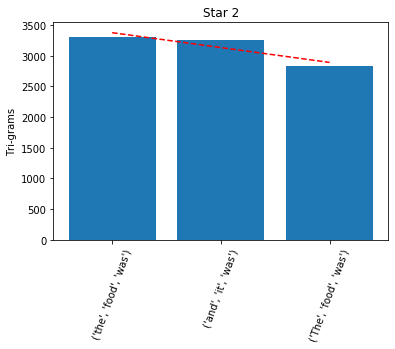

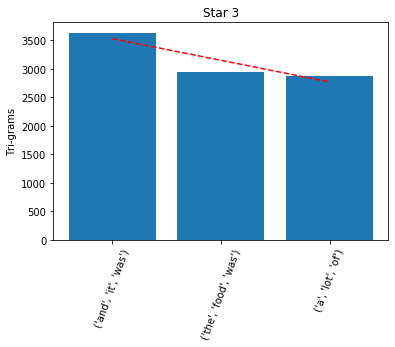

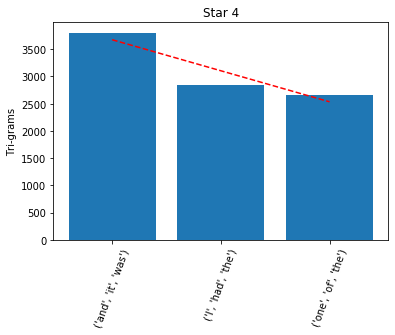

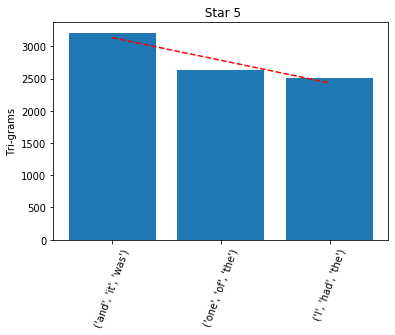

In [0]:

'''
Citation: https://stackoverflow.com/questions/13925251/python-bar-plot-from-list-of-tuples

'''

def plot_grams(title,ylab,lis):
  # sort in-place from highest to lowest
  lis.sort(key=lambda x: x[1], reverse=True) 

  # save the names and their respective scores separately
  # reverse the tuples to go from most frequent to least frequent 
  grams = list(zip(*lis))[0]
  count = list(zip(*lis))[1]
  x_pos = np.arange(len(grams)) 

  # calculate slope and intercept for the linear trend line
  slope, intercept = np.polyfit(x_pos, count, 1)
  trendline = intercept + (slope * x_pos)
  plt.plot(x_pos, trendline, color='red', linestyle='--')    
  plt.bar(x_pos, count,align='center')
  plt.xticks(x_pos, grams, rotation=70) 
  plt.ylabel(ylab)
  plt.title(title)
  plt.show()


all_x,all_y,all_z = [],[],[]
stars = ["Star 1","Star 2","Star 3","Star 4"," Star 5"]
#All the common words, unigrams and bigrams in all the sentiments
for i in [1,2,3,4,5]:
    x,y,z = MostCommonPostEDA(i,3)
    all_x.append(x)
    all_y.append(y)
    all_z.append(z)

for x,i in zip(all_x,stars):
  plot_grams(i,"Most Common Words",x)

for y,i in zip(all_y,stars):
  plot_grams(i,"Bi-grams",y)

for z,i in zip(all_z,stars):
  plot_grams(i,"Tri-grams",z)


In [0]:
#Basic Data Cleaning fucntion

c = 0
def text_preprocess(given_review):
    review = given_review
    review = re.sub('[^a-zA-Z]', ' ',review)
    review = review.lower()
    review = review.split()
    lemmatizer = WordNetLemmatizer()
    review = [lemmatizer.lemmatize(w) for w in review if not w in set(stopwords.words('english'))]
    global c
    c+=1
    print(c)
    return (' '.join(review))
 

#### These Blocks take time to run as they are ralated to Data cleaning!!!
#### I have included a cleaned file with the code

In [0]:
yelp_reviews_ds['cleaned_text'] = yelp_reviews_ds['text'].apply(text_preprocess)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [0]:
#yelp_reviews_clean.to_csv("yelp_reviews_clean.tsv", sep='\t', index = False)


#### Loading the cleaned file from the drive

In [0]:

#yelp_reviews_clean = yelp_reviews_ds.copy()
yelp_reviews_clean = pd.read_csv("/content/drive/My Drive/yelp_reviews_clean.tsv", sep="\t", encoding='utf8')
yelp_reviews_clean = yelp_reviews_clean.dropna(axis=0, subset=['cleaned_text'])


In [5]:
yelp_reviews_clean['stars']

0         1
1         1
2         1
3         1
4         1
         ..
249995    5
249996    5
249997    5
249998    5
249999    5
Name: stars, Length: 249956, dtype: int64

Average word length of phrases in corpus is: 60.845916881371124
The most common words in star 1 
 [(('food',), 47403), (('place',), 30476), (('service',), 25691)]
The most common bigrams in star 1 
 [(('customer', 'service'), 4514), (('go', 'back'), 2781), (('come', 'back'), 2549)]
The most common trigrams in star 1 
 [(('never', 'go', 'back'), 1051), (('never', 'come', 'back'), 606), (('worst', 'service', 'ever'), 525)]
The most common words in star 2 
 [(('food',), 51976), (('good',), 34568), (('place',), 32359)]
The most common bigrams in star 2 
 [(('go', 'back'), 2784), (('food', 'good'), 2729), (('la', 'vega'), 2585)]
The most common trigrams in star 2 
 [(('would', 'go', 'back'), 409), (('mac', 'n', 'cheese'), 387), (('nothing', 'write', 'home'), 375)]
The most common words in star 3 
 [(('good',), 47598), (('food',), 45923), (('place',), 32593)]
The most common bigrams in star 3 
 [(('pretty', 'good'), 4427), (('food', 'good'), 3534), (('come', 'back'), 3034)]
The most common t

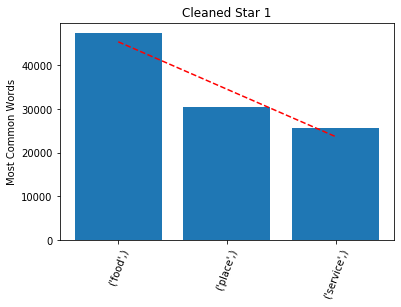

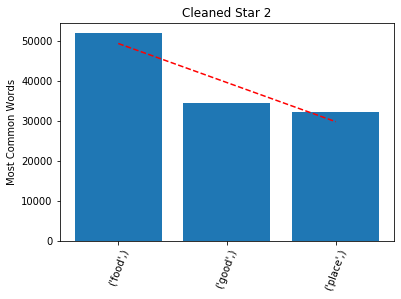

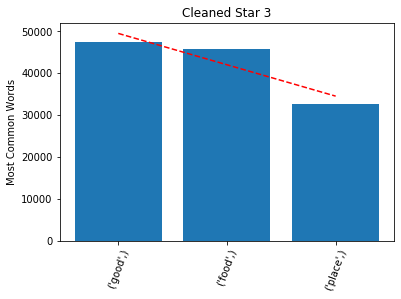

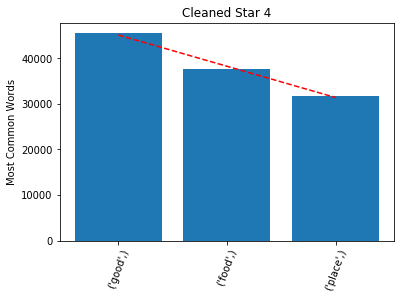

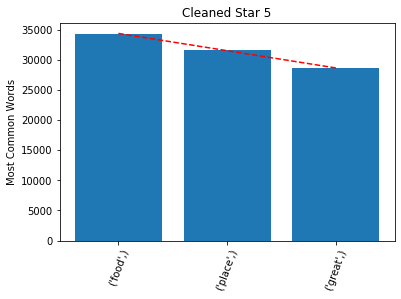

...

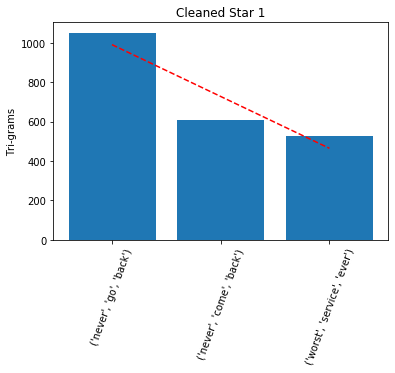

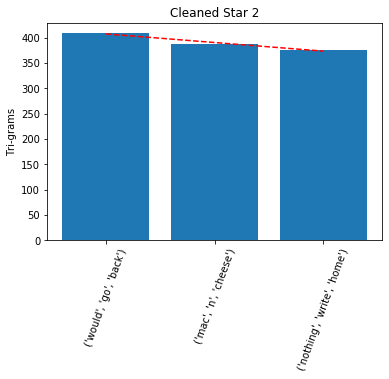

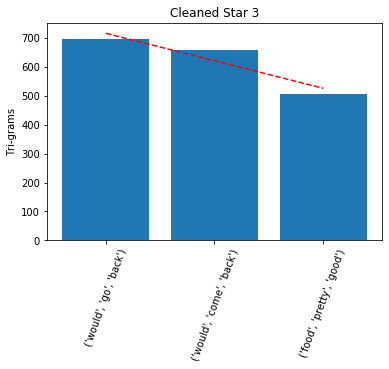

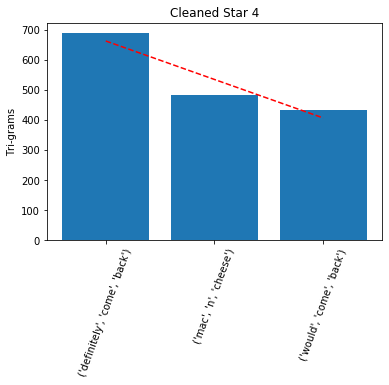

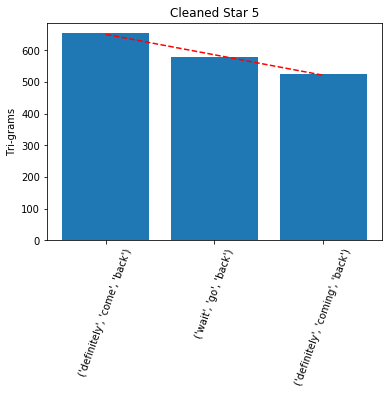

In [0]:
'''
Post Cleaning EDA

'''


print('Average word length of phrases in corpus is:',np.mean(yelp_reviews_clean['cleaned_text'].apply(lambda x: len(x.split()))))


def MostCommonPostEDA(star, no):
    text = ' '.join(yelp_reviews_clean.loc[yelp_reviews_clean.stars == star, 'cleaned_text'].values)
    text_unigrams = [i for i in ngrams(text.split(), 1)]
    text_bigrams = [i for i in ngrams(text.split(), 2)]
    text_trigrams = [i for i in ngrams(text.split(), 3)]
    print("The most common words in star",star,"\n", Counter(text_unigrams).most_common(no))
    print("The most common bigrams in star",star, "\n",Counter(text_bigrams).most_common(no))
    print("The most common trigrams in star",star, "\n",Counter(text_trigrams).most_common(no))
    return Counter(text_unigrams).most_common(no),Counter(text_bigrams).most_common(no),Counter(text_trigrams).most_common(no)




all_x,all_y,all_z = [],[],[]
stars = ["Cleaned Star 1","Cleaned Star 2","Cleaned Star 3","Cleaned Star 4","Cleaned Star 5"]
#All the common words, unigrams and bigrams in all the sentiments
for i in [1,2,3,4,5]:
    x,y,z = MostCommonPostEDA(i,3)
    all_x.append(x)
    all_y.append(y)
    all_z.append(z)

for x,i in zip(all_x,stars):
  plot_grams(i,"Most Common Words",x)

for y,i in zip(all_y,stars):
  plot_grams(i,"Bi-grams",y)

for z,i in zip(all_z,stars):
  plot_grams(i,"Tri-grams",z)




#### Data Visualization

(-0.5, 799.5, 499.5, -0.5)

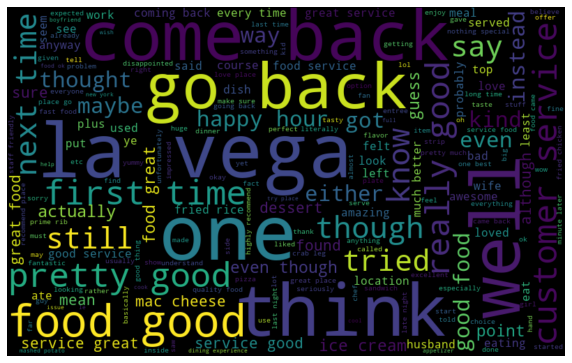

In [0]:
all_words = ' '.join([text for text in yelp_reviews_clean['cleaned_text']])
positive_words = ' '.join(yelp_reviews_clean.loc[yelp_reviews_clean.stars == 5, 'cleaned_text'].values)
negative_words = ' '.join(yelp_reviews_clean.loc[yelp_reviews_clean.stars == 1, 'cleaned_text'].values)
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')


(-0.5, 799.5, 499.5, -0.5)

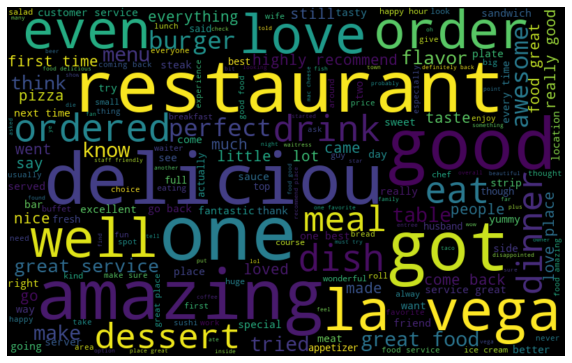

In [0]:

pos_wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(positive_words)
plt.figure(figsize=(10, 7))
plt.imshow(pos_wordcloud, interpolation="bilinear")
plt.axis('off')


(-0.5, 799.5, 499.5, -0.5)

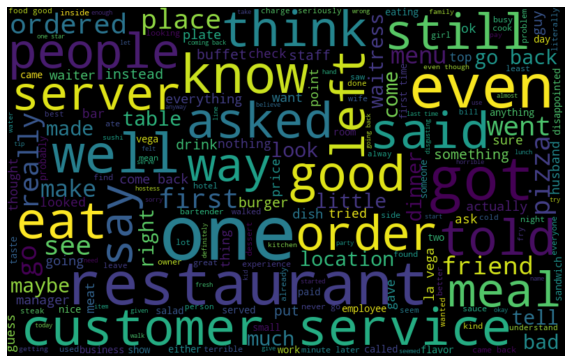

In [0]:

neg_wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(negative_words)
plt.figure(figsize=(10, 7))
plt.imshow(neg_wordcloud, interpolation="bilinear")
plt.axis('off')


#### Conventional Machine Learning Approach

In [16]:
#Splitting into train and test sets for the downsampled data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(yelp_reviews_clean['cleaned_text'],yelp_reviews_clean['stars'], test_size=0.2)
print (X_train.shape, y_train.shape)
print (X_test.shape, y_test.shape)

(199964,) (199964,)
(49992,) (49992,)


In [0]:

from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

cv = CountVectorizer(max_features = 50)
X_train_bow = cv.fit_transform(X_train).toarray()
X_test_bow = cv.fit_transform(X_test).toarray()

#Naive Bayes 
from sklearn.naive_bayes import MultinomialNB
classifier_mulnb = MultinomialNB()
classifier_mulnb.fit(X_train_bow, y_train)
y_test_pred_nulnb = classifier_mulnb.predict(X_test_bow)
mulnb_score = accuracy_score(y_test,y_test_pred_nulnb)
print("Multinomial Naive Bayes score", mulnb_score)


Multinomial Naive Bayes score 0.38592174747959673


In [0]:
#Logistic Regression

from sklearn.linear_model import LogisticRegression
log_reg = LogisticRegression()
log_reg.fit(X_train_bow,  y_train)
y_test_predicted_logreg = log_reg.predict(X_test_bow)
score_test_logreg = accuracy_score(y_test,y_test_predicted_logreg)
print("Logististic Regression score", score_test_logreg)


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


Logististic Regression score 0.39286285805728915


In [0]:
#Random Forests
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train_bow,  y_train)
y_test_predicted_rf = rf.predict(X_test_bow)
score_test_rf = metrics.accuracy_score(y_test, y_test_predicted_rf)
print("Random Forest score",score_test_rf)

/usr/local/lib/python3.6/dist-packages/sklearn/ensemble/forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Random Forest score 0.3365138422147544


In [0]:
#Linear SVC
from sklearn.svm import LinearSVC
clf_svm = LinearSVC()
clf_svm.fit(X_train_bow,  y_train)
y_test_predicted_svm = clf_svm.predict(X_test_bow)
score_test_svm = metrics.accuracy_score(y_test, y_test_predicted_svm)
print("Linear SVM score",score_test_svm)


Linear SVM score 0.3902824451912306


/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [0]:
#Baseline plot
[mulnb_score,score_test_svm,score_test_rf,score_test_logreg]


#### TFIDF- Pipelines

In [0]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
import numpy as np


num_fea = [1000,2000,5000,6000,8000,10000,20000,50000]
train_score_log_l = []
test_score_log_l = []
cnf_logreg = []


for i in num_fea:

  log_reg = LogisticRegression(penalty='l1', C=0.5)
  
  tfidf = TfidfVectorizer(
      input='content',
      encoding='utf-8',
      decode_error='strict',
      strip_accents=None,
      lowercase=True,
      preprocessor=None,
      tokenizer=None,
      stop_words=None,
      ngram_range=(1, 3),
      analyzer='word',
      max_df=1.0,
      min_df=1,
      max_features= i,
      vocabulary=None,
      binary=False,
  )

  pipeline_log_reg = Pipeline([
      ('tfidf', tfidf),
      ('logreg', log_reg)    ])



  pipeline_log_reg.fit(X_train, y_train)
  train_score_log = pipeline_log_reg.score(X_train, y_train)
  test_score_log = pipeline_log_reg.score(X_test, y_test)
  y_pred_pipeline_log_reg = pipeline_log_reg.predict(X_test)
  cnf = confusion_matrix(y_pred_pipeline_log_reg,y_test)
  print(classification_report(y_pred_pipeline_log_reg,y_test))
  cnf_logreg.append(cnf)
  train_score_log_l.append(train_score_log)
  test_score_log_l.append(test_score_log)
  
  print(i,"Train score",train_score_log)
  print(i,"Test Score ",test_score_log)
  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.76      0.65      0.70     11655
           2       0.43      0.50      0.46      8512
           3       0.47      0.51      0.49      9102
           4       0.47      0.51      0.49      9332
           5       0.74      0.65      0.69     11391

    accuracy                           0.57     49992
   macro avg       0.57      0.56      0.57     49992
weighted avg       0.59      0.57      0.58     49992

1000 Train score 0.5837750795143126
1000 Test Score  0.573231717074732


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.67      0.72     11508
           2       0.45      0.53      0.49      8550
           3       0.48      0.52      0.50      9258
           4       0.48      0.52      0.50      9390
           5       0.75      0.66      0.70     11286

    accuracy                           0.59     49992
   macro avg       0.59      0.58      0.58     49992
weighted avg       0.60      0.59      0.59     49992

2000 Train score 0.6051739313076354
2000 Test Score  0.5879740758521363


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.68      0.73     11369
           2       0.47      0.53      0.50      8687
           3       0.49      0.53      0.51      9225
           4       0.50      0.53      0.52      9501
           5       0.75      0.67      0.71     11210

    accuracy                           0.60     49992
   macro avg       0.60      0.59      0.59     49992
weighted avg       0.61      0.60      0.60     49992

5000 Train score 0.6240423276189714
5000 Test Score  0.5993959033445351


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.68      0.73     11361
           2       0.47      0.54      0.50      8701
           3       0.49      0.53      0.51      9221
           4       0.51      0.53      0.52      9529
           5       0.75      0.67      0.71     11180

    accuracy                           0.60     49992
   macro avg       0.60      0.59      0.59     49992
weighted avg       0.61      0.60      0.61     49992

6000 Train score

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


 0.6260626912844311
6000 Test Score  0.6001360217634821
              precision    recall  f1-score   support

           1       0.77      0.69      0.73     11329
           2       0.47      0.54      0.50      8704
           3       0.50      0.54      0.52      9231
           4       0.51      0.53      0.52      9596
           5       0.75      0.68      0.71     11132

    accuracy                           0.60     49992
   macro avg       0.60      0.59      0.60     49992
weighted avg       0.61      0.60      0.61     49992

8000 Train score 0.6276629793362806
8000 Test Score  0.6015962554008641


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.69      0.73     11329
           2       0.47      0.54      0.51      8733
           3       0.50      0.53      0.51      9238
           4       0.51      0.53      0.52      9547
           5       0.75      0.68      0.71     11145

    accuracy                           0.60     49992
   macro avg       0.60      0.59      0.60     49992
weighted avg       0.62      0.60      0.61     49992

10000 Train score 0.6286231521673902
10000 Test Score  0.6017762842054729


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.69      0.73     11335
           2       0.47      0.54      0.51      8708
           3       0.50      0.54      0.52      9227
           4       0.51      0.53      0.52      9543
           5       0.76      0.68      0.71     11179

    accuracy                           0.60     49992
   macro avg       0.60      0.60      0.60     49992
weighted avg       0.62      0.60      0.61     49992

20000 Train score 0.627582964933688
20000 Test Score  0.6026764282285165


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


              precision    recall  f1-score   support

           1       0.77      0.69      0.73     11388
           2       0.47      0.54      0.50      8674
           3       0.50      0.54      0.52      9148
           4       0.51      0.53      0.52      9546
           5       0.76      0.67      0.71     11236

    accuracy                           0.60     49992
   macro avg       0.60      0.59      0.60     49992
weighted avg       0.62      0.60      0.61     49992

50000 Train score 0.623267188093857
50000 Test Score  0.6020163226116179


In [0]:

train_score_mulnb_l = []
test_score_mulnb_l = []
cnf_mulnb = []

for i in num_fea:

  classifier_mulnb = MultinomialNB(alpha=1.0, fit_prior=True, class_prior=None)

  tfidf = TfidfVectorizer(
      input='content',
      encoding='utf-8',
      decode_error='strict',
      strip_accents=None,
      lowercase=True,
      preprocessor=None,
      tokenizer= None,
      stop_words=None,
      ngram_range=(1, 3),
      analyzer='word',
      max_df=1.0,
      min_df=1,
      max_features= i,
      vocabulary=None,
      binary=False,
  )

  pipeline_mulnb = Pipeline([
      ('tfidf', tfidf),
      ('classifier_mulnb', classifier_mulnb)  ])



  pipeline_mulnb.fit(X_train, y_train)
  train_score_mulnb = pipeline_mulnb.score(X_train, y_train)
  test_score_mulnb = pipeline_mulnb.score(X_test, y_test)
  y_pred_pipeline_mulnb = pipeline_mulnb.predict(X_test)
  cnf = confusion_matrix(y_pred_pipeline_mulnb,y_test)
  print(classification_report(y_pred_pipeline_mulnb,y_test))
  cnf_mulnb.append(cnf)
  train_score_mulnb_l.append(train_score_mulnb)
  test_score_mulnb_l.append(test_score_mulnb)
  print(i,"Train score",train_score_mulnb)
  print(i,"Test Score ",test_score_mulnb)


              precision    recall  f1-score   support

           1       0.69      0.62      0.65     11186
           2       0.40      0.45      0.42      8787
           3       0.47      0.46      0.47     10089
           4       0.48      0.49      0.48      9875
           5       0.67      0.67      0.67     10055

    accuracy                           0.54     49992
   macro avg       0.54      0.54      0.54     49992
weighted avg       0.55      0.54      0.54     49992

1000 Train score 0.5463433418015243
1000 Test Score  0.5409065450472076
              precision    recall  f1-score   support

           1       0.70      0.63      0.66     11097
           2       0.42      0.47      0.44      8915
           3       0.48      0.48      0.48     10014
           4       0.49      0.50      0.50      9869
           5       0.69      0.68      0.68     10097

    accuracy                           0.56     49992
   macro avg       0.55      0.55      0.55     49992
weigh

In [0]:

train_score_rf_l = []
test_score_rf_l = []
cnf_rf = []

for i in num_fea:

  rf = RandomForestClassifier(max_depth=2, random_state=0, n_estimators = 1000)

  tfidf = TfidfVectorizer(
      input='content',
      encoding='utf-8',
      decode_error='strict',
      strip_accents=None,
      lowercase=True,
      preprocessor=None,
      tokenizer= None,
      stop_words=None,
      ngram_range=(1, 3),
      analyzer='word',
      max_df=1.0,
      min_df=1,
      max_features= i,
      vocabulary=None,
      binary=False,
  )

  pipeline_rf = Pipeline([
      ('tfidf', tfidf),
      ('classifier_rf', rf)  ])

  pipeline_rf.fit(X_train, y_train)
  train_score_rf = pipeline_rf.score(X_train, y_train)
  test_score_rf = pipeline_rf.score(X_test, y_test)
  y_pred_pipeline_rf = pipeline_rf.predict(X_test)
  cnf = confusion_matrix(y_pred_pipeline_rf,y_test)
  print(classification_report(y_pred_pipeline_rf,y_test))
  cnf_rf.append(cnf)
  train_score_rf_l.append(train_score_rf)
  test_score_rf_l.append(test_score_rf)
  print(i,"Train score",train_score_rf)
  print(i,"Test Score ",test_score_rf)
  print(i,"Confusion Matrix: \n",cnf_rf)
  


              precision    recall  f1-score   support

           1       0.72      0.53      0.61     13549
           2       0.19      0.43      0.26      4328
           3       0.40      0.40      0.40      9881
           4       0.22      0.43      0.29      5230
           5       0.76      0.45      0.56     17004

    accuracy                           0.46     49992
   macro avg       0.46      0.45      0.43     49992
weighted avg       0.57      0.46      0.49     49992

1000 Train score 0.45712228201076194
1000 Test Score  0.4585733717394783
1000 Confusion Matrix: 
 [array([[7231, 3473, 1526,  769,  550],
       [ 874, 1881, 1097,  334,  142],
       [ 719, 2530, 3981, 2107,  544],
       [ 144,  498, 1161, 2250, 1177],
       [1106, 1546, 2179, 4591, 7582]])]
              precision    recall  f1-score   support

           1       0.71      0.55      0.62     12910
           2       0.24      0.46      0.31      5186
           3       0.38      0.43      0.40      882

In [0]:


train_score_svc_l = []
test_score_svc_l = []
cnf_svc = []


for i in num_fea:

  svc = LinearSVC(
      C=1.0,
      class_weight='balanced',
      dual=False,
      fit_intercept=True,
      intercept_scaling=1,
      loss='squared_hinge',
      max_iter=2000,
      multi_class='ovr',
      penalty='l2',
      random_state=0,
      tol=1e-05, 
      verbose=0
  )

  tfidf = TfidfVectorizer(
      input='content',
      encoding='utf-8',
      decode_error='strict',
      strip_accents=None,
      lowercase=True,
      preprocessor=None,
      tokenizer=None,
      stop_words=None,
      ngram_range=(1, 3),
      analyzer='word',
      max_df=1.0,
      min_df=1,
      max_features= i,
      vocabulary=None,
      binary=False,
  )

  pipeline_svc = Pipeline([
      ('tfidf', tfidf),
      ('svc', svc)    ])



  pipeline_svc.fit(X_train, y_train)
  train_score_svc = pipeline_svc.score(X_train, y_train)
  test_score_svc = pipeline_svc.score(X_test, y_test)
  y_pred_pipeline_svc = pipeline_svc.predict(X_test)
  cnf = confusion_matrix(y_pred_pipeline_svc,y_test)
  print(classification_report(y_pred_pipeline_svc,y_test))
  cnf_svc.append(cnf)
  train_score_svc_l.append(train_score_svc)
  test_score_svc_l.append(test_score_svc)
  print(i,"Train score",train_score_svc)
  print(i,"Test Score ",test_score_svc)
  

              precision    recall  f1-score   support

           1       0.78      0.64      0.70     12301
           2       0.41      0.50      0.45      8106
           3       0.44      0.51      0.47      8534
           4       0.45      0.50      0.48      9059
           5       0.76      0.63      0.69     11992

    accuracy                           0.57     49992
   macro avg       0.57      0.56      0.56     49992
weighted avg       0.60      0.57      0.58     49992

1000 Train score 0.5785741433458023
1000 Test Score  0.5670307249159866
              precision    recall  f1-score   support

           1       0.78      0.66      0.71     12055
           2       0.43      0.52      0.47      8187
           3       0.46      0.52      0.49      8785
           4       0.47      0.51      0.49      9178
           5       0.76      0.65      0.70     11787

    accuracy                           0.58     49992
   macro avg       0.58      0.57      0.57     49992
weigh

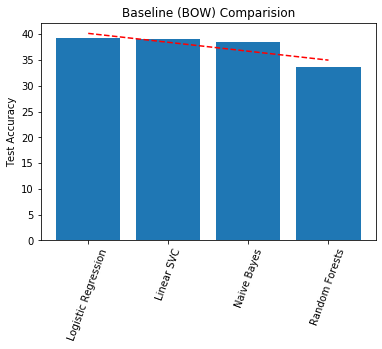

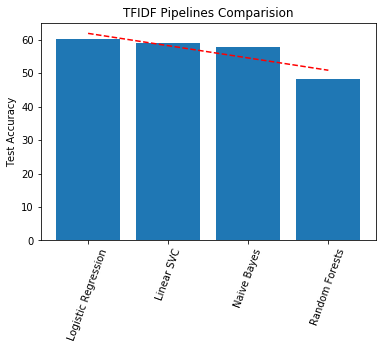

In [26]:
#Best accuracy comparision
#Values Taken from the above models and rounded to 2 decimals to plot
baseline_scores = [('Logistic Regression',39.2),('Naive Bayes',38.5),('Random Forests',33.6),('Linear SVC',39)]
best_scores_tfidf = [('Logistic Regression',60.26),('Naive Bayes',57.86),('Random Forests',48.37),('Linear SVC',58.9)]

plot_grams("Baseline (BOW) Comparision","Test Accuracy",baseline_scores)
plot_grams("TFIDF Pipelines Comparision","Test Accuracy",best_scores_tfidf)


In [0]:
def plot_acc(lis1,lis2,title):

  fig, ax = plt.subplots(1, 1 ,figsize=(7,7))
  ax.plot(num_fea, lis1, label='train')
  ax.plot(num_fea, lis2, label='test')
  plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  ax.set_xlabel('No.of Features')
  ax.set_ylabel('Accuracy')
  plt.title(title)
  plt.show()

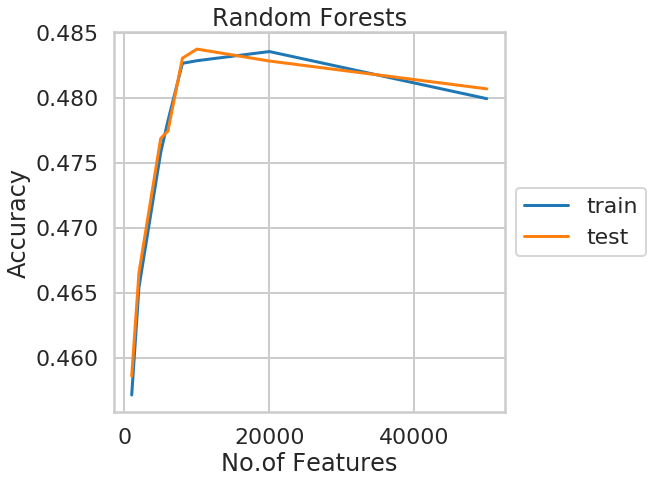

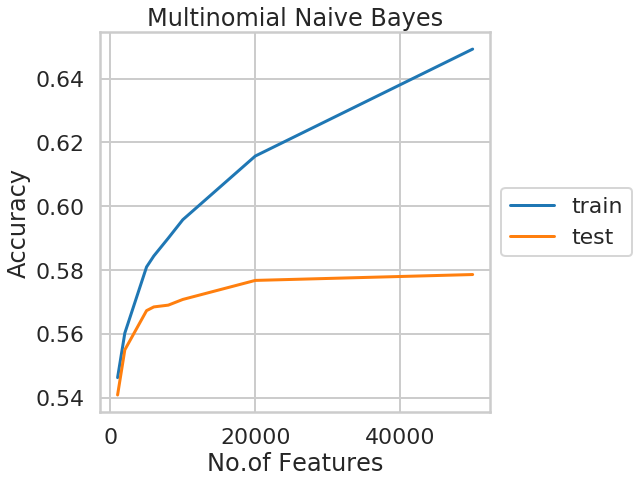

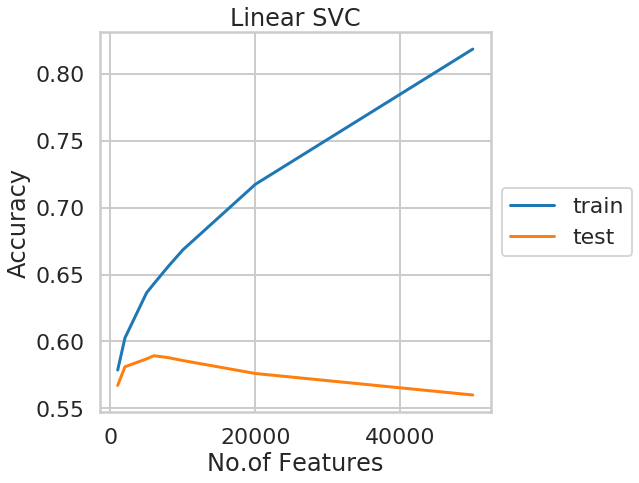

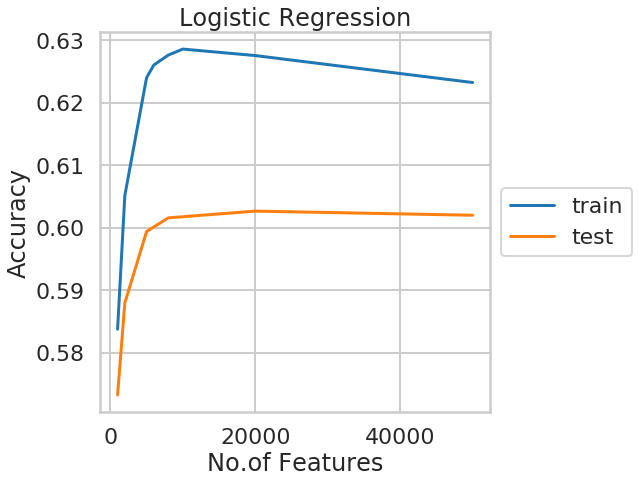

In [0]:
plot_acc(train_score_rf_l,test_score_rf_l,"Random Forests")
plot_acc(train_score_mulnb_l,test_score_mulnb_l,"Multinomial Naive Bayes")
plot_acc(train_score_svc_l,test_score_svc_l,"Linear SVC")
plot_acc(train_score_log_l,test_score_log_l,'Logistic Regression')


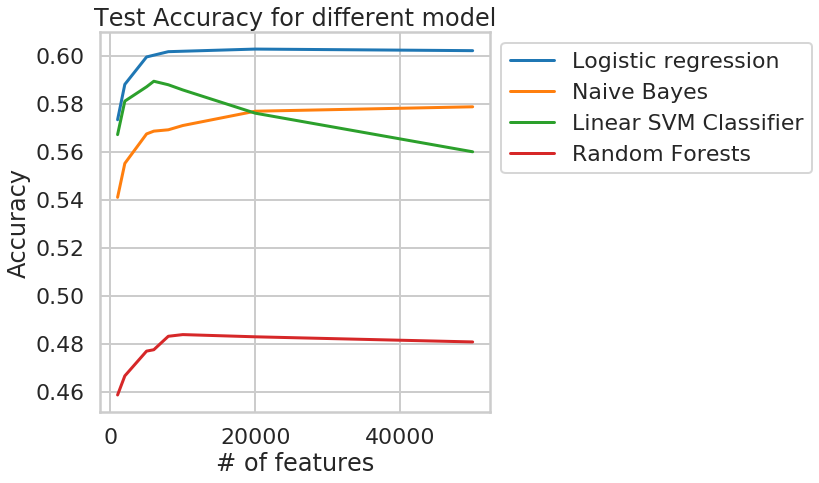

In [0]:
import matplotlib.pyplot as plt 



fig, ax = plt.subplots(1, 1 ,figsize=(7,7))
plt.plot(num_fea, test_score_log_l, label='Logistic regression') 
plt.plot(num_fea, test_score_mulnb_l,label='Naive Bayes') 
plt.plot(num_fea, test_score_svc_l,label='Linear SVM Classifier') 
plt.plot(num_fea, test_score_rf_l,label='Random Forests') 


plt.legend(bbox_to_anchor=(1, 1), loc='upper left', ncol=1)
 
plt.xlabel('# of features') 

plt.ylabel('Accuracy') 
 
plt.title('Test Accuracy for different model') 
  
plt.show()

In [0]:
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
import itertools

"""

Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
"""



def plot_confusion_matrix(cm,target_names,title= 'Confusion matrix',
                          cmap=None,
                          normalize=True):
   

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.2f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Label')
    plt.show()

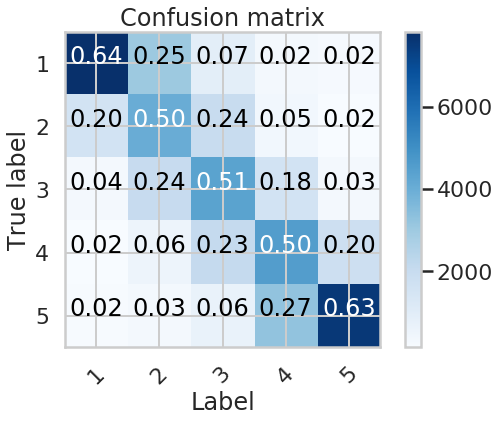

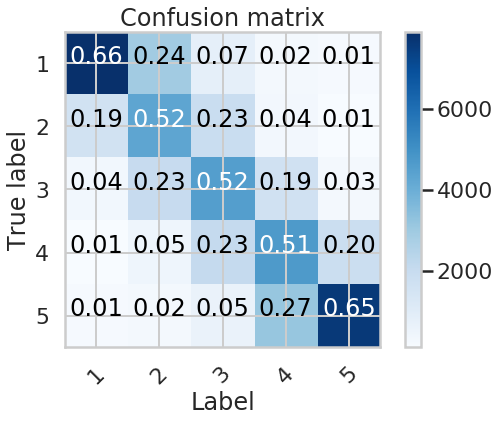

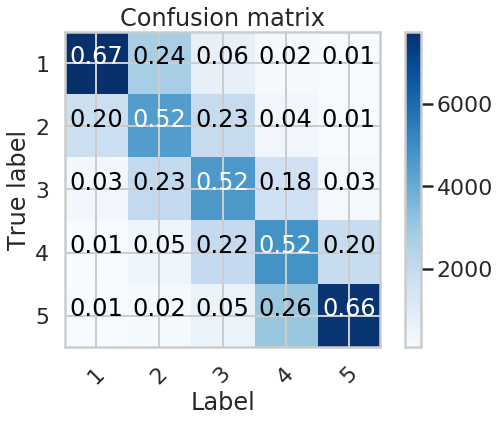

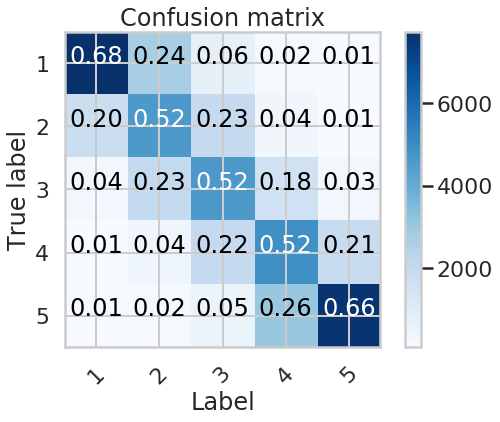

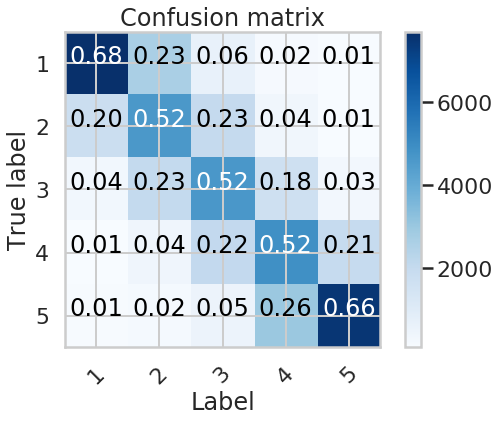

...

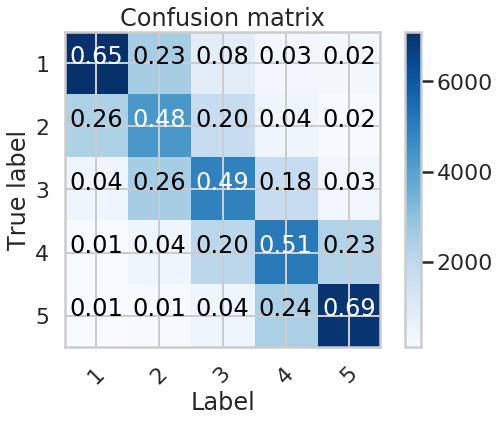

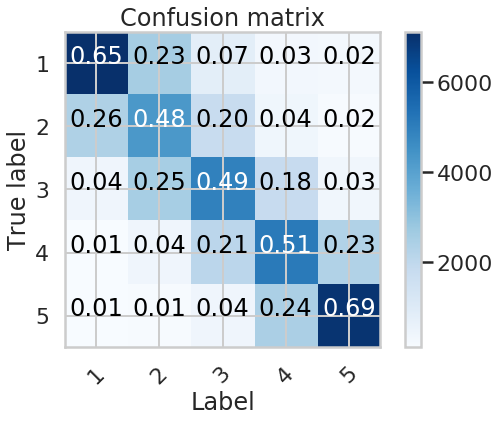

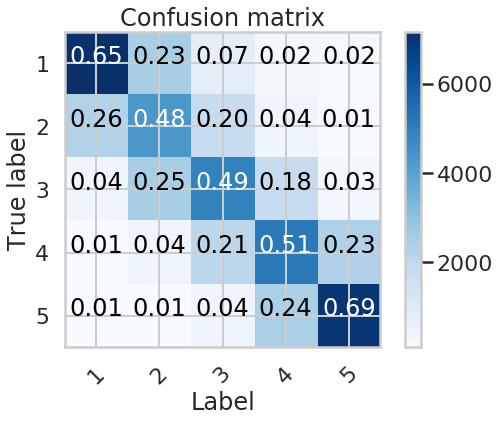

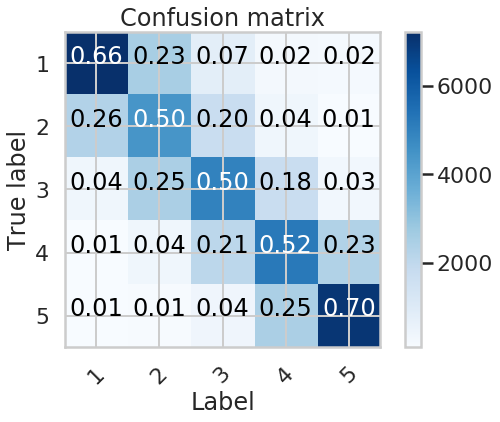

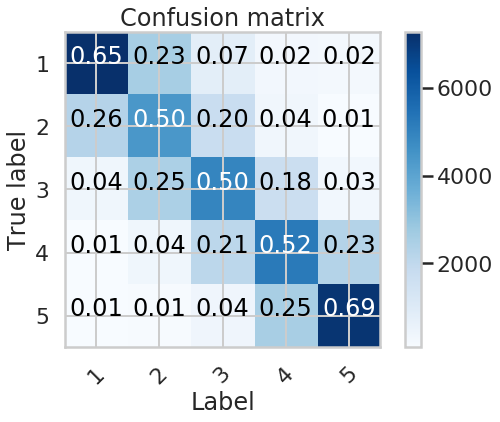

In [0]:
# cnf_svc
# cnf_logreg
# cnf_rf
# cnf_mulnb


star = ['1', '2','3','4','5']


for cn in cnf_svc:
  plot_confusion_matrix(cn,star)

for cn in cnf_logreg:
  plot_confusion_matrix(cn,star)

for cn in cnf_rf:
  plot_confusion_matrix(cn,star)


for cn in cnf_mulnb:
  plot_confusion_matrix(cn,star)



#### Deep Learning Approach

In [3]:
#Neural Network Approach:
from numpy import array
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils.vis_utils import plot_model
from keras.models import Model
from keras.layers import InputLayer
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D
from keras.layers.merge import concatenate
from keras.models import Sequential
from keras.layers import LSTM, Activation
from keras.layers import Input
from sklearn.model_selection import train_test_split
import pandas as pd


yelp_reviews_clean = pd.read_csv("/content/drive/My Drive/yelp_reviews_clean.tsv", sep="\t", encoding='utf8')
yelp_reviews_clean = yelp_reviews_clean.dropna(axis=0, subset=['cleaned_text'])


text = yelp_reviews_clean['cleaned_text'].values
stars = yelp_reviews_clean['stars'].values

train_x, test_x, train_y, test_y = train_test_split(text, stars, test_size=0.25)


Using TensorFlow backend.


In [0]:
def create_tokenizer(lines):
  tokenizer = Tokenizer()
  tokenizer.fit_on_texts(lines)
  return tokenizer

def max_length(lines):
	return max([len(s) for s in lines])

def encode_text(tokenizer, lines, length):
	encoded = tokenizer.texts_to_sequences(lines)
	padded = pad_sequences(encoded, maxlen=length, padding = 'post')
	return padded

In [5]:
tokenizer = create_tokenizer(train_x)
length = max_length(train_x)
vocab_size = len(tokenizer.word_index) + 1
train = encode_text(tokenizer, train_x, length)
print(train.shape)
test = encode_text(tokenizer, test_x, length)

(187467, 3655)


In [6]:
#One hot encoding of labels:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
train_values = array(train_y)
test_values = array(test_y)

label_encoder = LabelEncoder()
integer_encoded_train = label_encoder.fit_transform(train_values)
integer_encoded_test = label_encoder.fit_transform(test_values)

onehot_encoder = OneHotEncoder(sparse=False)
train_labels = onehot_encoder.fit_transform(integer_encoded_train.reshape(len(integer_encoded_train), 1))
test_labels = onehot_encoder.fit_transform(integer_encoded_test.reshape(len(integer_encoded_test), 1))


/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/preprocessing/_encoders.py:415: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a Lab

In [0]:
import os
import pickle

pickle.dump(train, open("/content/drive/My Drive/train_dl.pkl", "wb"))
pickle.dump(test, open("/content/drive/My Drive/test_dl.pkl", "wb"))
pickle.dump(train_labels, open("/content/drive/My Drive/train_labels_dl.pkl", "wb"))
pickle.dump(test_labels, open("/content/drive/My Drive/test_labels_dl.pkl", "wb"))

In [7]:
%%time
#CNN Implementation:
model_cnn = Sequential()
model_cnn.add(InputLayer((length,)))
model_cnn.add(Activation('relu'))
model_cnn.add(Embedding(vocab_size, 100))
model_cnn.add(Conv1D(filters=100, kernel_size=3, activation='relu'))
model_cnn.add(Dropout(0.2))
model_cnn.add(MaxPooling1D(pool_size=3))
model_cnn.add(Flatten())
model_cnn.add(Dense(10, activation='relu'))
model_cnn.add(Dense(5, activation='softmax'))
model_cnn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
model_cnn.summary()







Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.



Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
activation_1 (Activation)    (None, 3655)              0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 3655, 100)         8105600   
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 3653, 100)         30100     
_________________________________________________________________
dropout_1 (Dropout)          (None, 3653, 100)         0         
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 1217, 100)         0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 121700)            0        

In [8]:
history_cnn = model_cnn.fit(train, train_labels, epochs= 5,batch_size=100,validation_data=(test, test_labels), verbose=1)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Train on 187467 samples, validate on 62489 samples
Epoch 1/5





187467/187467 [==============================] - 113s 601us/step - loss: 1.1382 - acc: 0.5246 - val_loss: 0.9776 - val_acc: 0.5865
Epoch 2/5
187467/187467 [==============================] - 110s 587us/step - loss: 0.8955 - acc: 0.6183 - val_loss: 0.9412 - val_acc: 0.5873
Epoch 3/5
187467/187467 [==============================] - 110s 587us/step - loss: 0.7902 - acc: 0.6667 - val_loss: 0.9766 - val_acc: 0.5860
Epoch 4/5
187467/187467 [==============================] - 110s 587us/step - loss: 0.6807 - acc: 0.7193 - val_loss: 1.0366 - val_acc: 0.5779
Epoch 5/5
187467/187467 [==============================] - 110s 587us/step - loss: 0.5709 - acc: 0.7710 - val_loss: 1.1778 - val_acc: 0.5671


In [0]:
import pickle
pickle.dump(model_cnn, open("/content/drive/My Drive/model_CNN.pkl", "wb"))
 

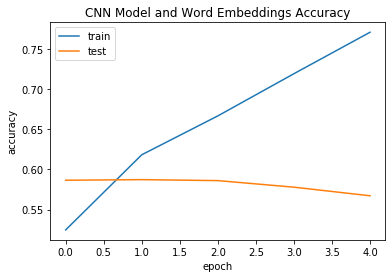

In [11]:
import matplotlib.pyplot as plt


plt.plot(history_cnn.history['acc'])
plt.plot(history_cnn.history['val_acc'])
plt.title('CNN Model and Word Embeddings Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [0]:
loss_cnn, accuracy_cnn = model_cnn.evaluate(test, test_labels, verbose=0)

In [13]:
accuracy_cnn

0.5671398166000923

In [69]:
from sklearn.metrics import classification_report
ratings_values = ["star 1","star 2","star 3","star 4","star 5"]

test_pred_cnn = model_cnn.predict(test)
test_pred_cnn_y = np.argmax(test_pred_cnn,axis = 1)
test_cnn_y = np.argmax(test_labels,axis = 1)
print(classification_report(test_cnn_y,test_pred_cnn_y,target_names=ratings_values))

              precision    recall  f1-score   support

      star 1       0.73      0.66      0.69     12623
      star 2       0.47      0.58      0.52     12430
      star 3       0.48      0.45      0.46     12496
      star 4       0.51      0.41      0.45     12569
      star 5       0.65      0.74      0.69     12371

    accuracy                           0.57     62489
   macro avg       0.57      0.57      0.56     62489
weighted avg       0.57      0.57      0.56     62489



In [37]:
%%time
import numpy as np

from keras.layers import GlobalMaxPooling1D
def glove_feature_matrix(file, word_index, embedding_dim):
    vsize = len(word_index) + 1
    embedding_matrix = np.zeros((vocab_size, embedding_dim))
    with open(file) as f:
        for line in f:
            word, *vector = line.split()
            if word in word_index:
                idx = word_index[word] 
                embedding_matrix[idx] = np.array(vector, dtype=np.float32)[:embedding_dim]

    return embedding_matrix

feature_set_matrix = glove_feature_matrix('/content/drive/My Drive/glove.6B.100d.txt',tokenizer.word_index, 100)


model_Glove = Sequential()
model_Glove.add(Embedding(vocab_size, 100, weights=[feature_set_matrix], input_length=length))
model_Glove.add(Conv1D(100, 3, activation='relu'))
model_Glove.add(GlobalMaxPooling1D())
model_Glove.add(Dense(512, activation='relu'))
model_Glove.add(Dense(5, activation='softmax'))
model_Glove.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy',f1_m,precision_m,recall_m])
model_Glove.summary()



Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 3655, 100)         8105600   
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 3653, 100)         30100     
_________________________________________________________________
global_max_pooling1d_2 (Glob (None, 100)               0         
_________________________________________________________________
dense_5 (Dense)              (None, 512)               51712     
_________________________________________________________________
dense_6 (Dense)              (None, 5)                 2565      
Total params: 8,189,977
Trainable params: 8,189,977
Non-trainable params: 0
_________________________________________________________________
CPU times: user 3.56 s, sys: 157 ms, total: 3.71 s
Wall time: 3.73 s


In [15]:
%%time
history_glove = model_Glove.fit(train, train_labels,epochs= 5,batch_size=100, validation_data=(test, test_labels))

Train on 187467 samples, validate on 62489 samples
Epoch 1/5
187467/187467 [==============================] - 96s 510us/step - loss: 1.0206 - acc: 0.5472 - val_loss: 0.9377 - val_acc: 0.5859
Epoch 2/5
187467/187467 [==============================] - 97s 519us/step - loss: 0.8732 - acc: 0.6159 - val_loss: 0.9281 - val_acc: 0.5910
Epoch 3/5
187467/187467 [==============================] - 96s 512us/step - loss: 0.7772 - acc: 0.6649 - val_loss: 0.9533 - val_acc: 0.5870
Epoch 4/5
187467/187467 [==============================] - 95s 509us/step - loss: 0.6691 - acc: 0.7179 - val_loss: 1.0335 - val_acc: 0.5837
Epoch 5/5
187467/187467 [==============================] - 96s 509us/step - loss: 0.5525 - acc: 0.7727 - val_loss: 1.2060 - val_acc: 0.5701
CPU times: user 4min 45s, sys: 2min 33s, total: 7min 18s
Wall time: 8min


In [0]:

pickle.dump(model_Glove, open("/content/drive/My Drive/model_CNN_GloVe.pkl", "wb"))


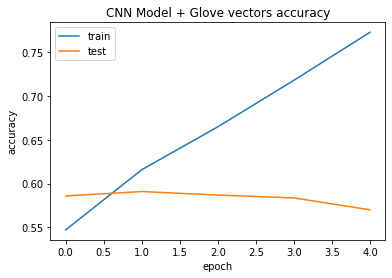

In [17]:
import keras
from matplotlib import pyplot as plt
plt.plot(history_glove.history['acc'])
plt.plot(history_glove.history['val_acc'])
plt.title('CNN Model + Glove vectors accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [18]:
loss_cnn_Glove, accuracy_cnn_Glove = model_Glove.evaluate(test, test_labels, verbose=0)
accuracy_cnn_Glove

0.5701323432881272

In [71]:

test_pred_cnn_glove = model_Glove.predict(test)
test_pred_cnn_glove_y = np.argmax(test_pred_cnn_glove,axis = 1)
test_cnn_glove_y = np.argmax(test_labels,axis = 1)
print(classification_report(test_cnn_glove_y,test_pred_cnn_glove_y,target_names = ratings_values))


              precision    recall  f1-score   support

      star 1       0.72      0.68      0.70     12623
      star 2       0.48      0.56      0.51     12430
      star 3       0.51      0.43      0.47     12496
      star 4       0.50      0.55      0.52     12569
      star 5       0.70      0.66      0.68     12371

    accuracy                           0.57     62489
   macro avg       0.58      0.57      0.58     62489
weighted avg       0.58      0.57      0.58     62489



Difference between Conventional machine learning and Deep Learning Approach

In [0]:
all_models = [("CNN + Word Embeddings",58),("CNN+GloVe Features",57),('Logistic Regression',60.26),('Naive Bayes',57.86),('Random Forests',48.37),('Linear SVC',58.9)]

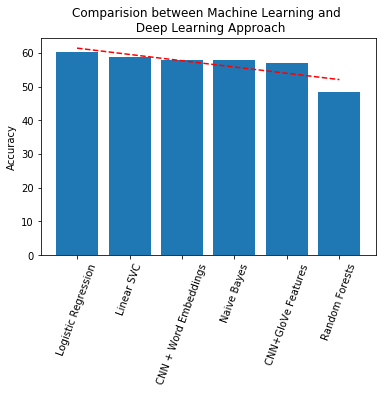

In [75]:

plot_grams("Comparision between Machine Learning and \n Deep Learning Approach","Accuracy",all_models)